 # FAKE NEWS DETECTION PROJECT



## Step 1: Problem Statement and Business Case

### i. Right now, we live in a world of misinformation and fake news. The goal of this project is to detect fake news based on Neural Networks and NLP.
### ii. NLP works by converting words(text) into numbers.
### iii. These numbers are then used to train an AI/ML models to make predictions.
### iv. AI/ML based fake news detector is crucial for companies and media to automatically predict whether            circulating news is fake or not.
### v. In this project, we will analyze thousands of news text to detect if it is fake or not.

## Step 2: Import Libraries and Datasets

In [1]:
import nltk
nltk.download('punkt')

import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
import nltk
import re
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize

import gensim               ## It is an open-source library for unsupervised topic modelling and natural language processing

from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS

from tensorflow.keras.preprocessing.text import one_hot, Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Embedding, Input, LSTM, Conv1D, MaxPool1D, Bidirectional
from tensorflow.keras.models import Model
from jupyterthemes import jtplot
jtplot.style(theme = 'monokai', context = 'notebook', ticks = True, grid = False)

## setting the style of notebook to be monokai theme
## this line of code is important to ensure that we are able to see x and y axis clearly
## if we don't run this code line, we'll notice that xlabel and ylabel on any plot is black and it'll be hard to see them.

[nltk_data] Downloading package punkt to C:\Users\ACER-
[nltk_data]     PC\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
## Load the Data

df_true = pd.read_csv('True.csv')
df_fake = pd.read_csv('Fake.csv')

In [3]:
## Firt five rows of True.csv data

df_true.head()

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"


In [4]:
## First five rows of Fake.csv data

df_fake.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [5]:
## Shape of df_true and df_fake

print(df_true.shape)
print(df_fake.shape)

(21417, 4)
(23481, 4)


In [6]:
## we'll look for null values in both the data

print(df_true.isnull().sum())
print(df_fake.isnull().sum())

title      0
text       0
subject    0
date       0
dtype: int64
title      0
text       0
subject    0
date       0
dtype: int64


In [7]:
## Both our data does not contain any null values, therefore, we'll move to step 3 i.e., Exploratory Data Analysis

## Step 3: Performing Exploratory Data Analysis

In [8]:
## In this, firstly we'll add a target class column to indicate whether the news is real or fake

df_true['isfake'] = 1
df_true.head()

,title,text,subject,date,isfake
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1


In [9]:
df_fake['isfake'] = 0
df_fake.head()

,title,text,subject,date,isfake
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",0
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017",0
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017",0
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017",0
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017",0


In [10]:
## Now, we'll concatenate real and fake news

df = pd.concat([df_true, df_fake]).reset_index(drop = True)
df

,title,text,subject,date,isfake
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1
...,...,...,...,...,...
44893,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,"January 16, 2016",0
44894,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,"January 16, 2016",0
44895,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,"January 15, 2016",0
44896,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,"January 14, 2016",0


In [11]:
## Now, we'll drop the date column as it is not relevant in our prediction

df.drop(columns = ['date'], inplace = True)

In [12]:
df.head()

,title,text,subject,isfake
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,1
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,1
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,1
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,1


In [13]:
## Now we'll combine both the text and title together in a new column entitles 'original'

df['original'] = df['title'] + ' ' + df['text']
df.head()

,title,text,subject,isfake,original
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,1,"As U.S. budget fight looms, Republicans flip t..."
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,1,U.S. military to accept transgender recruits o...
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,1,Senior U.S. Republican senator: 'Let Mr. Muell...
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,1,FBI Russia probe helped by Australian diplomat...
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,1,Trump wants Postal Service to charge 'much mor...


In [14]:
## Explore a sample news

df['original'][0]

'As U.S. budget fight looms, Republicans flip their fiscal script WASHINGTON (Reuters) - The head of a conservative Republican faction in the U.S. Congress, who voted this month for a huge expansion of the national debt to pay for tax cuts, called himself a “fiscal conservative” on Sunday and urged budget restraint in 2018. In keeping with a sharp pivot under way among Republicans, U.S. Representative Mark Meadows, speaking on CBS’ “Face the Nation,” drew a hard line on federal spending, which lawmakers are bracing to do battle over in January. When they return from the holidays on Wednesday, lawmakers will begin trying to pass a federal budget in a fight likely to be linked to other issues, such as immigration policy, even as the November congressional election campaigns approach in which Republicans will seek to keep control of Congress. President Donald Trump and his Republicans want a big budget increase in military spending, while Democrats also want proportional increases for non

## Step 4: Performing Data Cleaning

In [15]:
## download stopwords

nltk.download('stopwords')

[nltk_data] Downloading package stopwords to C:\Users\ACER-
[nltk_data]     PC\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [16]:
## Obtain additional stopwords from nltk

from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])

In [17]:
## Now, we'll remove stopwords and also the words with 2 or less characters

def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3 and token not in stop_words:
            result.append(token)
            
    return result

In [18]:
## Now, we'll apply the function to the dataframe

df['combined'] = df['original'].apply(preprocess)

In [19]:
print(df['combined'][0])

['budget', 'fight', 'looms', 'republicans', 'flip', 'fiscal', 'script', 'washington', 'reuters', 'head', 'conservative', 'republican', 'faction', 'congress', 'voted', 'month', 'huge', 'expansion', 'national', 'debt', 'cuts', 'called', 'fiscal', 'conservative', 'sunday', 'urged', 'budget', 'restraint', 'keeping', 'sharp', 'pivot', 'republicans', 'representative', 'mark', 'meadows', 'speaking', 'face', 'nation', 'drew', 'hard', 'line', 'federal', 'spending', 'lawmakers', 'bracing', 'battle', 'january', 'return', 'holidays', 'wednesday', 'lawmakers', 'begin', 'trying', 'pass', 'federal', 'budget', 'fight', 'likely', 'linked', 'issues', 'immigration', 'policy', 'november', 'congressional', 'election', 'campaigns', 'approach', 'republicans', 'seek', 'control', 'congress', 'president', 'donald', 'trump', 'republicans', 'want', 'budget', 'increase', 'military', 'spending', 'democrats', 'want', 'proportional', 'increases', 'defense', 'discretionary', 'spending', 'programs', 'support', 'educati

In [20]:
df

,title,text,subject,isfake,original,combined
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,1,"As U.S. budget fight looms, Republicans flip t...","[budget, fight, looms, republicans, flip, fisc..."
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,1,U.S. military to accept transgender recruits o...,"[military, accept, transgender, recruits, mond..."
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,1,Senior U.S. Republican senator: 'Let Mr. Muell...,"[senior, republican, senator, mueller, washing..."
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,1,FBI Russia probe helped by Australian diplomat...,"[russia, probe, helped, australian, diplomat, ..."
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,1,Trump wants Postal Service to charge 'much mor...,"[trump, wants, postal, service, charge, amazon..."
...,...,...,...,...,...,...
44893,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,0,McPain: John McCain Furious That Iran Treated ...,"[mcpain, john, mccain, furious, iran, treated,..."
44894,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,0,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,"[justice, yahoo, settles, mail, privacy, class..."
44895,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,0,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,"[sunnistan, allied, safe, zone, plan, territor..."
44896,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,0,How to Blow $700 Million: Al Jazeera America F...,"[blow, million, jazeera, america, finally, cal..."


In [21]:
## Obtain the total words present in the dataset

list_of_words = []
for i in df.combined:
    for j in i:
        list_of_words.append(j)

In [22]:
## Now, we'll obtain the total number of unique words

total_words = len(list(set(list_of_words)))
total_words

108704

In [23]:
## Therefore, there are total 108704 words in our dataset

In [24]:
## Join the words into a string

df['combined'] = df['combined'].apply(lambda x: " ".join(x))

In [25]:
df['combined'][0]

'budget fight looms republicans flip fiscal script washington reuters head conservative republican faction congress voted month huge expansion national debt cuts called fiscal conservative sunday urged budget restraint keeping sharp pivot republicans representative mark meadows speaking face nation drew hard line federal spending lawmakers bracing battle january return holidays wednesday lawmakers begin trying pass federal budget fight likely linked issues immigration policy november congressional election campaigns approach republicans seek control congress president donald trump republicans want budget increase military spending democrats want proportional increases defense discretionary spending programs support education scientific research infrastructure public health environmental protection trump administration willing going increase defense discretionary spending percent meadows chairman small influential house freedom caucus said program democrats saying need government raise 

## Step 5: Visualize the cleaned up dataset

In [26]:
df

,title,text,subject,isfake,original,combined
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,1,"As U.S. budget fight looms, Republicans flip t...",budget fight looms republicans flip fiscal scr...
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,1,U.S. military to accept transgender recruits o...,military accept transgender recruits monday pe...
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,1,Senior U.S. Republican senator: 'Let Mr. Muell...,senior republican senator mueller washington r...
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,1,FBI Russia probe helped by Australian diplomat...,russia probe helped australian diplomat washin...
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,1,Trump wants Postal Service to charge 'much mor...,trump wants postal service charge amazon shipm...
...,...,...,...,...,...,...
44893,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,0,McPain: John McCain Furious That Iran Treated ...,mcpain john mccain furious iran treated sailor...
44894,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,0,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,justice yahoo settles mail privacy class actio...
44895,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,0,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,sunnistan allied safe zone plan territorial bo...
44896,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,0,How to Blow $700 Million: Al Jazeera America F...,blow million jazeera america finally calls qui...


In [27]:
## Text per subject

df_grouped = df[['isfake', 'subject', 'text']].groupby(['isfake', 'subject']).count()
df_grouped

text
isfake subject               
0      Government News   1570
       Middle-east        778
       News              9050
       US_News            783
       left-news         4459
       politics          6841
1      politicsNews     11272
       worldnews        10145

<AxesSubplot:xlabel='count', ylabel='subject'>

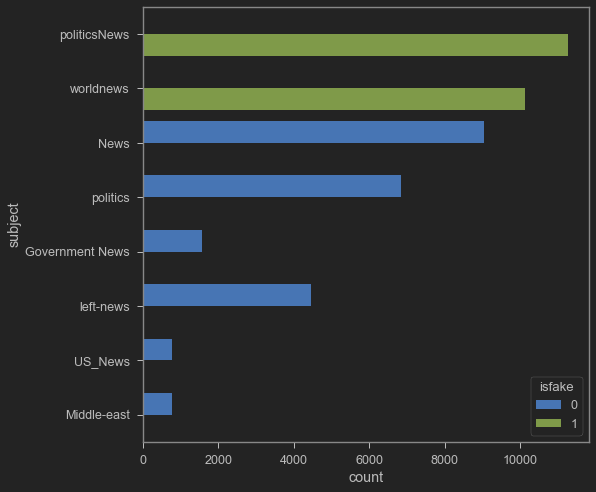

In [28]:
## plot the counts of words in subjects

plt.figure(figsize = (8,8))
sns.countplot(y = 'subject', hue = 'isfake', data = df)

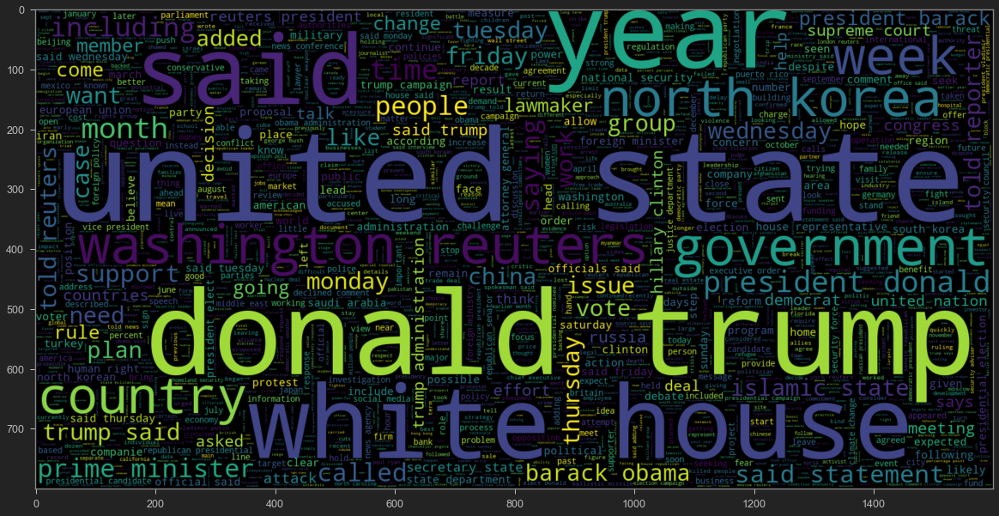

In [29]:
## Now we'll plot the word cloud for text that is real

plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 2000, width = 1600, height = 800, stopwords = stop_words).generate(" ".join(df[df.isfake == 1].combined))
plt.imshow(wc, interpolation = 'bilinear')

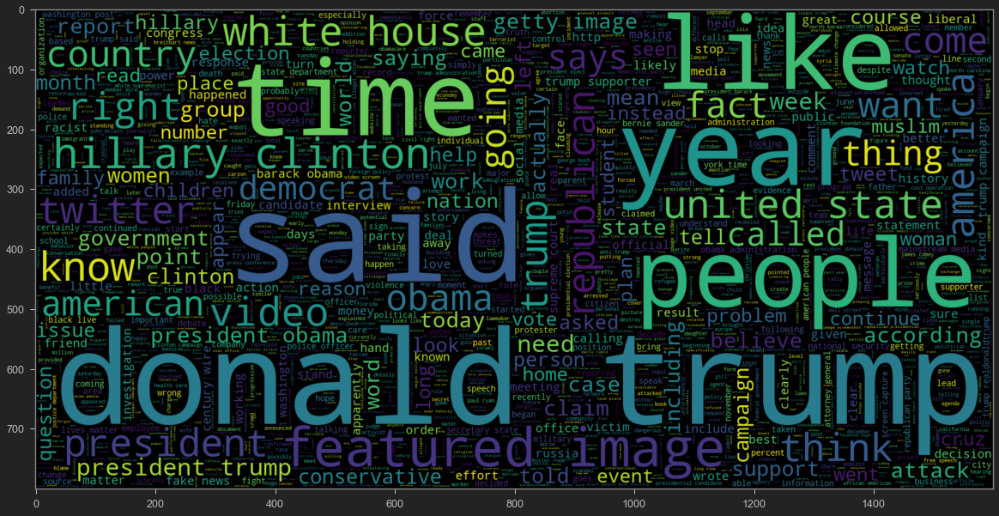

In [30]:
## Now we'll plot word cloud for text that is fake

plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 2000, width = 1600, height = 800, stopwords = stop_words).generate(" ".join(df[df.isfake == 0].combined))
plt.imshow(wc, interpolation = 'bilinear')

In [31]:
## Length of maximum document will be needed to create word embeddings

maxlen = -1
for doc in df.combined:
    tokens = nltk.word_tokenize(doc)
    if(maxlen<len(tokens)):
        maxlen = len(tokens)
print('The maximum number of words in any document is : ', maxlen)

The maximum number of words in any document is :  4405


In [32]:
## Now, we'll visualize the distribution of number of words in a text

import plotly.express as px
fig = px.histogram(x = [len(nltk.word_tokenize(x)) for x in df.combined], nbins = 100)
fig.show()

## Step 6: Preparing Data by Performing Tokenization and Padding

### Tokenizer allows us to vectorize text corpus by turning each text into a sequence of integers
### For eg., suppose we have sentence "budget fight looms republicans flip fiscal script Washington Reuters head conservative republican faction congress voted month....." and the tokens for this sentence will be "[3138, 3581, 2895, 27, 5354, 22457, 3505, 9, 3198, 35, ......]"

In [33]:
## Splitting data into train and test

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df.combined, df.isfake, test_size = 0.2)

In [34]:
from nltk import word_tokenize

In [35]:
## Now, we'll create a tokenizer to tokenize the words and create sequences of tokenized words

tokenizer = Tokenizer(num_words = total_words)
tokenizer.fit_on_texts(X_train)
train_sequences = tokenizer.texts_to_sequences(X_train)
test_sequences = tokenizer.texts_to_sequences(X_test)

In [36]:
train_sequences

[[118,
  36,
  4428,
  397,
  954,
  10034,
  2823,
  9,
  118,
  663,
  13040,
  19603,
  3,
  2636,
  954,
  889,
  69,
  460,
  70,
  7861,
  62,
  2929,
  2071,
  38285,
  7814,
  161,
  20110,
  815,
  328,
  14,
  225,
  1350,
  3083,
  11,
  217,
  409,
  36,
  106,
  4402,
  491,
  8423,
  1243,
  164,
  5,
  5946,
  13518,
  409,
  223,
  2379,
  2345,
  916,
  36,
  2268,
  1533,
  34,
  280,
  3,
  1081,
  285,
  1042,
  1214,
  5082,
  62,
  342,
  36,
  282,
  753,
  50,
  2,
  1368,
  13355,
  34,
  1294,
  25,
  4690,
  954,
  219,
  282,
  225,
  1168,
  16,
  9,
  17,
  12,
  1127,
  409,
  5131,
  865,
  9953,
  69,
  2611,
  2104,
  643,
  3226,
  3609,
  954,
  3,
  282,
  96,
  3226,
  2,
  163,
  1693,
  4816,
  1150,
  4486,
  1895,
  1442,
  304,
  118,
  1895,
  258,
  96,
  2,
  1694,
  2693,
  69,
  2824,
  495,
  5297,
  445,
  118,
  2448,
  480,
  283,
  535,
  1353,
  512,
  7174,
  636,
  954,
  841,
  2704,
  1296,
  487,
  1090,
  106,
  3011,
  1547,


In [37]:
len(train_sequences)

35918

In [38]:
test_sequences

[[386,
  2726,
  232,
  764,
  572,
  48,
  17415,
  158,
  3041,
  386,
  9,
  386,
  3,
  3563,
  1295,
  945,
  1928,
  232,
  764,
  786,
  292,
  464,
  572,
  48,
  13984,
  206,
  578,
  764,
  401,
  904,
  717,
  2794,
  475,
  619,
  2232,
  158,
  3041,
  386,
  153,
  625,
  764,
  921,
  328,
  746,
  18432,
  2567,
  292,
  118,
  324,
  375,
  663,
  3280,
  2108,
  274,
  82,
  145,
  974,
  1295,
  2,
  904,
  890,
  31,
  332,
  716,
  1787,
  1751,
  556,
  1476,
  508,
  232,
  1928,
  16,
  199,
  93,
  45,
  7531,
  22,
  151,
  4026,
  1295,
  2,
  825,
  764,
  401,
  6802,
  901,
  148,
  578,
  48,
  292,
  2363,
  694,
  1479,
  3725,
  764,
  4877,
  512,
  460,
  24366,
  295,
  164,
  5,
  91,
  904,
  367,
  1075,
  1226,
  5732,
  62,
  4737,
  475,
  17415,
  158,
  3041,
  62,
  337,
  2,
  1052,
  464,
  974,
  5181,
  62,
  1807,
  409,
  4075,
  14791,
  5703,
  2794,
  259,
  43673,
  475,
  6067,
  991,
  1258,
  138,
  764,
  7578,
  62,
  9769,


In [39]:
len(test_sequences)

8980

In [40]:
print('The encoding for document\n', df.combined[0], "\n is : ", train_sequences[0])

The encoding for document
 budget fight looms republicans flip fiscal script washington reuters head conservative republican faction congress voted month huge expansion national debt cuts called fiscal conservative sunday urged budget restraint keeping sharp pivot republicans representative mark meadows speaking face nation drew hard line federal spending lawmakers bracing battle january return holidays wednesday lawmakers begin trying pass federal budget fight likely linked issues immigration policy november congressional election campaigns approach republicans seek control congress president donald trump republicans want budget increase military spending democrats want proportional increases defense discretionary spending programs support education scientific research infrastructure public health environmental protection trump administration willing going increase defense discretionary spending percent meadows chairman small influential house freedom caucus said program democrats say

In [41]:
## Now add padding, maxlen = 4406 or smaller number maxlen = 40 seems to work well based on results

padded_train = pad_sequences(train_sequences, maxlen = 40, padding = 'post', truncating = 'post')
padded_test = pad_sequences(test_sequences, maxlen = 40, truncating = 'post')

In [42]:
for i, doc in enumerate(padded_train[:2]):
    print('The padded encoding for document', i+1, " is : ", doc)

The padded encoding for document 1  is :  [  118    36  4428   397   954 10034  2823     9   118   663 13040 19603
     3  2636   954   889    69   460    70  7861    62  2929  2071 38285
  7814   161 20110   815   328    14   225  1350  3083    11   217   409
    36   106  4402   491]
The padded encoding for document 2  is :  [ 1797 15478  4980     1  2770  1607    27    22   439  1797   129   439
  7957 15478  5696   665   939    10     1 35110   440  1607  6132  3922
  2422    13   237  2770  4416 14114   178   201  3332     1   462  2126
   832  1234   440  1607]


## Step 7: Build and Train the model

### Embedding Layer:
#### Embedding layers learn the low-dimensional continuous representation of input discrete variables. For example, suppose that we have 100,000 unique values in our data and we want to train the model with this data. Even though we can train the model to generate accurate results, it would require more resources to train. Alternatively, by introducing an embedding layer, we can specify the number of low-dimensional features that we would need to represent the input data, in this case let's take the value to be 200. Now, what happens is that the embedding layer learns the way to represent 100,000 variables with 200 variable only (think of it as PCA or Autoencoder). This in turn helps subsequent layers learn more effectively with less compute resources. 

In [43]:
## Sequential model

model = Sequential() 

## embedding layer 

model.add(Embedding(total_words, output_dim = 128))

## Bi-directional LSTM

model.add(Bidirectional(LSTM(128)))

## Dense Layers

model.add(Dense(128, activation = 'relu'))
model.add(Dense(1, activation = 'sigmoid'))
model.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['acc'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, None, 128)         13914112  
                                                                 
 bidirectional (Bidirectiona  (None, 256)              263168    
 l)                                                              
                                                                 
 dense (Dense)               (None, 128)               32896     
                                                                 
 dense_1 (Dense)             (None, 1)                 129       
                                                                 
Total params: 14,210,305
Trainable params: 14,210,305
Non-trainable params: 0
_________________________________________________________________


In [44]:
total_words

108704

In [45]:
y_train = np.asarray(y_train)

In [46]:
## Train the model

history = model.fit(padded_train, y_train, batch_size = 64, validation_split = 0.1, epochs = 4)

Epoch 1/4
506/506 [==============================] - 158s 275ms/step - loss: 0.0400 - acc: 0.9871 - val_loss: 0.0049 - val_acc: 0.9989
Epoch 2/4
506/506 [==============================] - 112s 221ms/step - loss: 0.0026 - acc: 0.9995 - val_loss: 0.0055 - val_acc: 0.9983
Epoch 3/4
506/506 [==============================] - 113s 224ms/step - loss: 0.0024 - acc: 0.9996 - val_loss: 0.0069 - val_acc: 0.9992
Epoch 4/4
506/506 [==============================] - 113s 223ms/step - loss: 6.9398e-04 - acc: 0.9999 - val_loss: 0.0050 - val_acc: 0.9989


#### In the above model training we divided our data into 90% training data and 10% validation data, here, we are applying cross validation to make sure our model don't overfit the training data.
#### And, as we can see here both the training loss and validation loss is decreasing, so our model is able to generalize and it is not overfitting the training data.

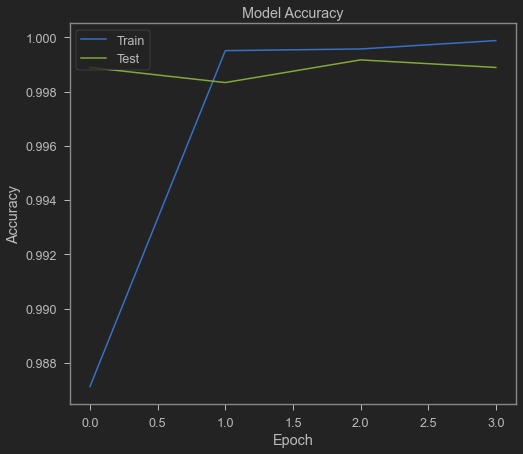

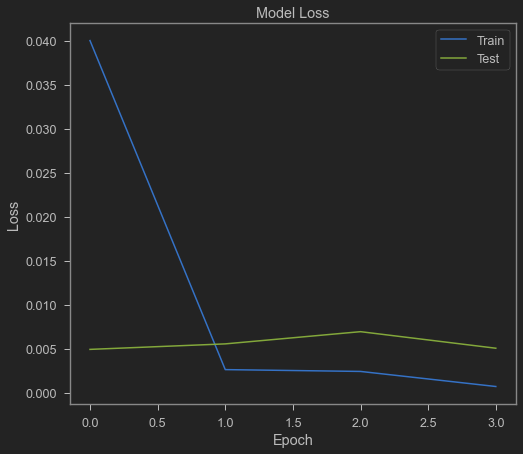

In [54]:
## Visualize the results

plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc = 'upper left')
plt.show()


plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc = 'upper right')
plt.show()

## Step 9: Assess Trained Model Performance

In [47]:
## Make prediction

pred = model.predict(padded_test)

In [48]:
## if the predicted values is >0.5 it is real else fake

prediction = []
for i in range(len(pred)):
    if pred[i].item() > 0.5:
        prediction.append(1)
    else:
        prediction.append(0)

In [49]:
## check accuracy 

from sklearn import metrics

accuracy = metrics.accuracy_score(list(y_test), prediction)

print("Model Accuracy is : ", accuracy)

Model Accuracy is :  0.9988864142538976


<AxesSubplot:>

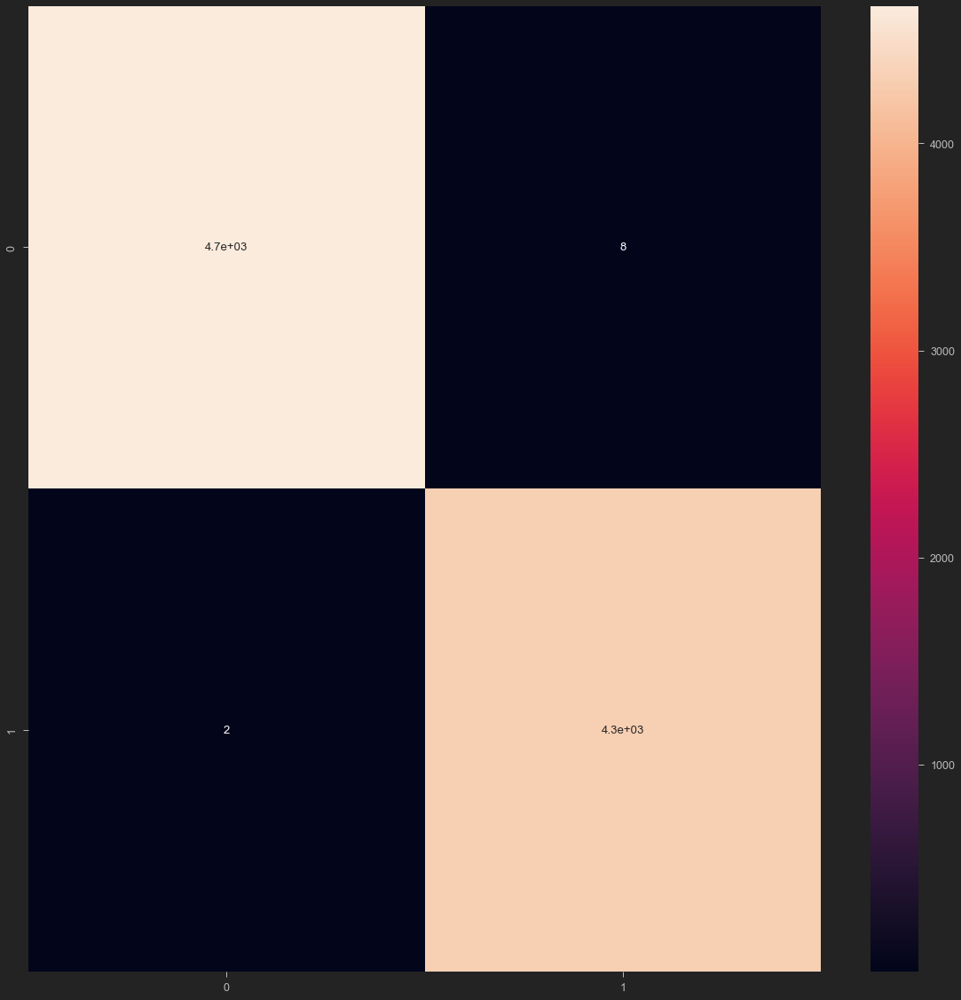

In [50]:
## get the confusion matrix 

cm = metrics.confusion_matrix(list(y_test), prediction)
plt.figure(figsize = (20,20))
sns.heatmap(cm, annot = True)

In [51]:
## category dict

category = {0: 'Fake News', 1: 'Real News'}

In [52]:
## get the results

for i in range(len(prediction[:2])):
    print('Title :\n\n', df[df.combined == X_test.values[i]].title.item(), "\n\nTopic :\n\n", df[df.combined == X_test.values[i]].subject.item(),
         "\n\nNews :\n\n", df[df.combined == X_test.values[i]].text.item(), "\n\nOriginal values :\n\n",
         category[df[df.combined == X_test.values[i]].isfake.item()], '\n\nPredicted value :\n\n', category[prediction[i]], '\n\n\n')

Title :

 Turkey threatens sanctions over Kurdish independence vote 

Topic :

 worldnews 

News :

 HABUR BORDER CROSSING, Turkey (Reuters) - Turkey s President Tayyip Erdogan threatened to impose sanctions against Kurdish northern Iraq over a planned independence vote, piling economic pressure on Kurdish authorities after Turkish troops deployed near the main commercial border crossing. Turkey, home to the largest Kurdish population in the region, has warned that any breakup of neighboring Iraq or Syria could lead to a global conflict, and is due to prepare a formal response on Friday, three days before the referendum. Erdogan said the Turkish cabinet and security council would discuss Ankara s options. They will  put forward their own stance on what kind of sanctions we can impose, or if we will,  he told reporters in New York, according to Anadolu news agency.  But these will not be ordinary,  Erdogan said. Iraqi Kurdish authorities have defied growing international pressure to cal